<a href="https://colab.research.google.com/github/rekonreagan/Final-Year-Project/blob/main/LinearRegression2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
pip install scikit-learn

In [3]:
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import os

In [4]:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
df = pd.read_csv('drive/My Drive/Colab Notebooks/wfp_food_prices_uga.csv',encoding='ISO-8859-1')
df

,date,admin1,admin2,market,latitude,longitude,category,commodity,unit,priceflag,pricetype,currency,price,usdprice
0,#date,#adm1+name,#adm2+name,#loc+market+name,#geo+lat,#geo+lon,#item+type,#item+name,#item+unit,#item+price+flag,#item+price+type,#currency,#value,#value+usd
1,2006-01-15,Busia,Samia-bugwe,Busia,0.467,34.09,cereals and tubers,Maize,KG,actual,Wholesale,UGX,298.4,0.1641
2,2006-01-15,Kampala,Central Kampala,Owino,0.322805,32.574841,cereals and tubers,Maize,KG,actual,Wholesale,UGX,345.42,0.19
3,2006-01-15,Kampala,Central Kampala,Owino,0.322805,32.574841,cereals and tubers,Rice,KG,actual,Wholesale,UGX,1013.4,0.5573
4,2006-01-15,Lira,Lira Municipality,Lira,2.235,32.909722,cereals and tubers,Maize,KG,actual,Wholesale,UGX,247.76,0.1362
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20291,2023-08-15,Tororo,Tororo Municipality,Tororo,0.69433,34.179499,cereals and tubers,Maize flour,KG,forecast,Retail,UGX,0.0,0.0
20292,2023-08-15,Tororo,Tororo Municipality,Tororo,0.69433,34.179499,cereals and tubers,Millet,KG,forecast,Retail,UGX,0.0,0.0
20293,2023-08-15,Tororo,Tororo Municipality,Tororo,0.69433,34.179499,cereals and tubers,Sorghum,KG,forecast,Retail,UGX,0.0,0.0
20294,2023-08-15,Tororo,Tororo Municipality,Tororo,0.69433,34.179499,oil and fats,Oil (vegetable),L,forecast,Retail,UGX,0.0,0.0


In [6]:
description = df.describe()
print(description)

              date   admin1           admin2 market  latitude  longitude  \
count        20296    20296            20296  20296     20296      20296   
unique         213       38               41     44        44         44   
top     2022-12-15  Kampala  Central Kampala  Owino  0.322805  32.574841   
freq           828     2190             2190   2190      2190       2190   

                  category commodity   unit priceflag pricetype currency  \
count                20296     20296  20296     20296     20296    20296   
unique                   9        39      6         3         3        2   
top     cereals and tubers     Beans     KG    actual    Retail      UGX   
freq                 11442      2524  16310     16239     18705    20295   

        price usdprice  
count   20296    20296  
unique   3873     7197  
top       0.0      0.0  
freq     4056     4056  


In [7]:
# Visualize the data using a box plot
# Visualize the data using a box plot
fig = px.box(df.dropna(), y=df.columns)
fig.update_layout(title='Food Prices Distribution', xaxis_title='Variables', yaxis_title='Prices')
fig.show()

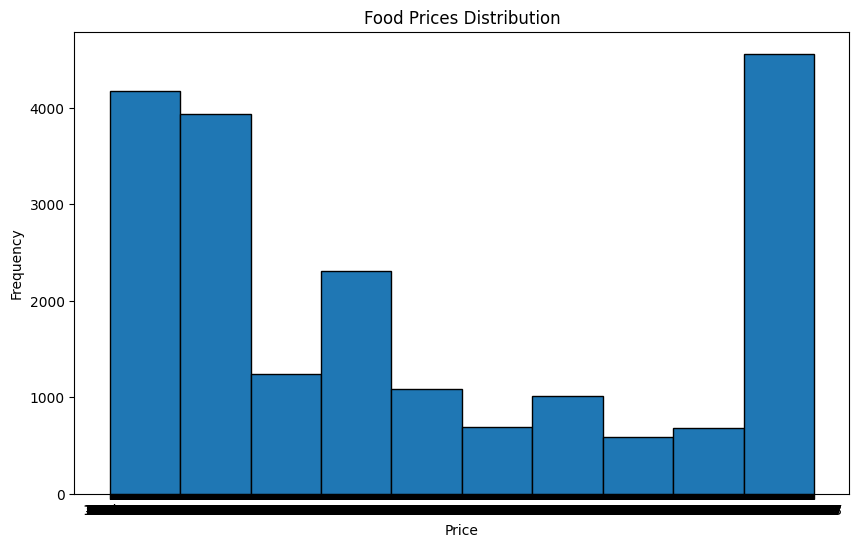

In [8]:
# Plot a histogram
plt.figure(figsize=(10, 6))
plt.hist(df['price'], bins=10, edgecolor='black')
plt.title('Food Prices Distribution')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()

In [9]:
df.isnull().sum()

date         0
admin1       0
admin2       0
market       0
latitude     0
longitude    0
category     0
commodity    0
unit         0
priceflag    0
pricetype    0
currency     0
price        0
usdprice     0
dtype: int64

In [10]:
# Explanatory data analysis
# the first 5 rows of the dataset
df.head()

,date,admin1,admin2,market,latitude,longitude,category,commodity,unit,priceflag,pricetype,currency,price,usdprice
0,#date,#adm1+name,#adm2+name,#loc+market+name,#geo+lat,#geo+lon,#item+type,#item+name,#item+unit,#item+price+flag,#item+price+type,#currency,#value,#value+usd
1,2006-01-15,Busia,Samia-bugwe,Busia,0.467,34.09,cereals and tubers,Maize,KG,actual,Wholesale,UGX,298.4,0.1641
2,2006-01-15,Kampala,Central Kampala,Owino,0.322805,32.574841,cereals and tubers,Maize,KG,actual,Wholesale,UGX,345.42,0.19
3,2006-01-15,Kampala,Central Kampala,Owino,0.322805,32.574841,cereals and tubers,Rice,KG,actual,Wholesale,UGX,1013.4,0.5573
4,2006-01-15,Lira,Lira Municipality,Lira,2.235,32.909722,cereals and tubers,Maize,KG,actual,Wholesale,UGX,247.76,0.1362


In [11]:
# The last 5 rows of dataset
df.tail()

,date,admin1,admin2,market,latitude,longitude,category,commodity,unit,priceflag,pricetype,currency,price,usdprice
20291,2023-08-15,Tororo,Tororo Municipality,Tororo,0.69433,34.179499,cereals and tubers,Maize flour,KG,forecast,Retail,UGX,0.0,0.0
20292,2023-08-15,Tororo,Tororo Municipality,Tororo,0.69433,34.179499,cereals and tubers,Millet,KG,forecast,Retail,UGX,0.0,0.0
20293,2023-08-15,Tororo,Tororo Municipality,Tororo,0.69433,34.179499,cereals and tubers,Sorghum,KG,forecast,Retail,UGX,0.0,0.0
20294,2023-08-15,Tororo,Tororo Municipality,Tororo,0.69433,34.179499,oil and fats,Oil (vegetable),L,forecast,Retail,UGX,0.0,0.0
20295,2023-08-15,Tororo,Tororo Municipality,Tororo,0.69433,34.179499,pulses and nuts,Beans,KG,forecast,Retail,UGX,0.0,0.0


In [12]:
# Total rows and columns
df.shape

(20296, 14)

In [13]:
# detailed information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20296 entries, 0 to 20295
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   date       20296 non-null  object
 1   admin1     20296 non-null  object
 2   admin2     20296 non-null  object
 3   market     20296 non-null  object
 4   latitude   20296 non-null  object
 5   longitude  20296 non-null  object
 6   category   20296 non-null  object
 7   commodity  20296 non-null  object
 8   unit       20296 non-null  object
 9   priceflag  20296 non-null  object
 10  pricetype  20296 non-null  object
 11  currency   20296 non-null  object
 12  price      20296 non-null  object
 13  usdprice   20296 non-null  object
dtypes: object(14)
memory usage: 2.2+ MB


In [14]:
# descriptive analysis
df.describe()

,date,admin1,admin2,market,latitude,longitude,category,commodity,unit,priceflag,pricetype,currency,price,usdprice
count,20296,20296,20296,20296,20296,20296,20296,20296,20296,20296,20296,20296,20296,20296
unique,213,38,41,44,44,44,9,39,6,3,3,2,3873,7197
top,2022-12-15,Kampala,Central Kampala,Owino,0.322805,32.574841,cereals and tubers,Beans,KG,actual,Retail,UGX,0.0,0.0
freq,828,2190,2190,2190,2190,2190,11442,2524,16310,16239,18705,20295,4056,4056


In [15]:
# since market is equivalent to its location(latitude and longitude), drop it
# columns: admin1, admin2, unit, price, currency and usdprice doesn't affect the price, drop it
df = df.drop(['admin1', 'admin2','market','unit', 'priceflag', 'currency','usdprice'], axis=1)

In [16]:
# columns were successfully dropped
df

,date,latitude,longitude,category,commodity,pricetype,price
0,#date,#geo+lat,#geo+lon,#item+type,#item+name,#item+price+type,#value
1,2006-01-15,0.467,34.09,cereals and tubers,Maize,Wholesale,298.4
2,2006-01-15,0.322805,32.574841,cereals and tubers,Maize,Wholesale,345.42
3,2006-01-15,0.322805,32.574841,cereals and tubers,Rice,Wholesale,1013.4
4,2006-01-15,2.235,32.909722,cereals and tubers,Maize,Wholesale,247.76
...,...,...,...,...,...,...,...
20291,2023-08-15,0.69433,34.179499,cereals and tubers,Maize flour,Retail,0.0
20292,2023-08-15,0.69433,34.179499,cereals and tubers,Millet,Retail,0.0
20293,2023-08-15,0.69433,34.179499,cereals and tubers,Sorghum,Retail,0.0
20294,2023-08-15,0.69433,34.179499,oil and fats,Oil (vegetable),Retail,0.0


In [17]:
# row at index 0; is meaningless, drop it
df = df.drop(0)

In [18]:
# the drop; successful
df

,date,latitude,longitude,category,commodity,pricetype,price
1,2006-01-15,0.467,34.09,cereals and tubers,Maize,Wholesale,298.4
2,2006-01-15,0.322805,32.574841,cereals and tubers,Maize,Wholesale,345.42
3,2006-01-15,0.322805,32.574841,cereals and tubers,Rice,Wholesale,1013.4
4,2006-01-15,2.235,32.909722,cereals and tubers,Maize,Wholesale,247.76
5,2006-02-15,0.467,34.09,cereals and tubers,Maize,Wholesale,296.59
...,...,...,...,...,...,...,...
20291,2023-08-15,0.69433,34.179499,cereals and tubers,Maize flour,Retail,0.0
20292,2023-08-15,0.69433,34.179499,cereals and tubers,Millet,Retail,0.0
20293,2023-08-15,0.69433,34.179499,cereals and tubers,Sorghum,Retail,0.0
20294,2023-08-15,0.69433,34.179499,oil and fats,Oil (vegetable),Retail,0.0


In [19]:
# dropping a range of rows containing forecast price(0.0); from it's start to it's end
df = df.drop(df.index[16242:20297])

In [20]:
# dropping a range of rows containing forecast price(0.0); from it's start to it's end
df = df.drop(df.index[16000:16242])

In [21]:
# drop was successful
df.tail()

,date,latitude,longitude,category,commodity,pricetype,price
15996,2023-01-15,0.35661,32.7523,oil and fats,Oil (vegetable),Retail,9250.0
15997,2023-01-15,0.35661,32.7523,pulses and nuts,Beans,Retail,3775.0
15998,2023-01-15,1.791367,34.598369,cereals and tubers,Maize (white),Retail,1475.0
15999,2023-01-15,1.791367,34.598369,cereals and tubers,Maize flour,Retail,3075.0
16000,2023-01-15,1.791367,34.598369,cereals and tubers,Sorghum,Retail,1350.0


In [22]:
# checking the type of prices in the dataset
# its made up of wholesale and retail prices
df['pricetype'].value_counts()

Retail       14545
Wholesale     1455
Name: pricetype, dtype: int64

In [23]:
# dividing the dataset into two; wholesale price only and retail price only
wholesale_df = df[df['pricetype']=='Wholesale'].reset_index(drop=True)
retail_df = df[df['pricetype']=='Retail'].reset_index(drop=True)

In [24]:
# wholesale price only
wholesale_df

,date,latitude,longitude,category,commodity,pricetype,price
0,2006-01-15,0.467,34.09,cereals and tubers,Maize,Wholesale,298.4
1,2006-01-15,0.322805,32.574841,cereals and tubers,Maize,Wholesale,345.42
2,2006-01-15,0.322805,32.574841,cereals and tubers,Rice,Wholesale,1013.4
3,2006-01-15,2.235,32.909722,cereals and tubers,Maize,Wholesale,247.76
4,2006-02-15,0.467,34.09,cereals and tubers,Maize,Wholesale,296.59
...,...,...,...,...,...,...,...
1450,2022-05-15,0.322805,32.574841,cereals and tubers,Rice,Wholesale,3296.23
1451,2022-05-15,0.322805,32.574841,pulses and nuts,Beans,Wholesale,2694.75
1452,2022-05-15,2.235,32.909722,cereals and tubers,Maize,Wholesale,1190.64
1453,2022-05-15,2.235,32.909722,pulses and nuts,Beans,Wholesale,2499.95


In [25]:
# dropping pricetype column
wholesale_df=wholesale_df.drop(columns=['pricetype'])

In [26]:
# drop successful
wholesale_df

,date,latitude,longitude,category,commodity,price
0,2006-01-15,0.467,34.09,cereals and tubers,Maize,298.4
1,2006-01-15,0.322805,32.574841,cereals and tubers,Maize,345.42
2,2006-01-15,0.322805,32.574841,cereals and tubers,Rice,1013.4
3,2006-01-15,2.235,32.909722,cereals and tubers,Maize,247.76
4,2006-02-15,0.467,34.09,cereals and tubers,Maize,296.59
...,...,...,...,...,...,...
1450,2022-05-15,0.322805,32.574841,cereals and tubers,Rice,3296.23
1451,2022-05-15,0.322805,32.574841,pulses and nuts,Beans,2694.75
1452,2022-05-15,2.235,32.909722,cereals and tubers,Maize,1190.64
1453,2022-05-15,2.235,32.909722,pulses and nuts,Beans,2499.95


In [27]:
# checking contents of category column in wholesale_df
wholesale_df['category'].value_counts()

cereals and tubers       951
pulses and nuts          309
vegetables and fruits    195
Name: category, dtype: int64

In [28]:
# dataset containing whole price for only cereals and tubers
cereal_tuber_wholesale_df= wholesale_df[wholesale_df['category']== 'cereals and tubers'].reset_index(drop=True)

In [29]:
# whole price for cereals and tubers only
cereal_tuber_wholesale_df

,date,latitude,longitude,category,commodity,price
0,2006-01-15,0.467,34.09,cereals and tubers,Maize,298.4
1,2006-01-15,0.322805,32.574841,cereals and tubers,Maize,345.42
2,2006-01-15,0.322805,32.574841,cereals and tubers,Rice,1013.4
3,2006-01-15,2.235,32.909722,cereals and tubers,Maize,247.76
4,2006-02-15,0.467,34.09,cereals and tubers,Maize,296.59
...,...,...,...,...,...,...
946,2022-05-15,-1.25,29.989999771118164,cereals and tubers,Maize,1365.58
947,2022-05-15,0.322805,32.574841,cereals and tubers,Maize,1248.98
948,2022-05-15,0.322805,32.574841,cereals and tubers,Rice,3296.23
949,2022-05-15,2.235,32.909722,cereals and tubers,Maize,1190.64


In [30]:
# dropping category column
cereal_tuber_wholesale_df=cereal_tuber_wholesale_df.drop(columns='category')

In [31]:
# drop successful
cereal_tuber_wholesale_df

,date,latitude,longitude,commodity,price
0,2006-01-15,0.467,34.09,Maize,298.4
1,2006-01-15,0.322805,32.574841,Maize,345.42
2,2006-01-15,0.322805,32.574841,Rice,1013.4
3,2006-01-15,2.235,32.909722,Maize,247.76
4,2006-02-15,0.467,34.09,Maize,296.59
...,...,...,...,...,...
946,2022-05-15,-1.25,29.989999771118164,Maize,1365.58
947,2022-05-15,0.322805,32.574841,Maize,1248.98
948,2022-05-15,0.322805,32.574841,Rice,3296.23
949,2022-05-15,2.235,32.909722,Maize,1190.64


In [32]:
# checking the data types of all the columns
cereal_tuber_wholesale_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 951 entries, 0 to 950
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   date       951 non-null    object
 1   latitude   951 non-null    object
 2   longitude  951 non-null    object
 3   commodity  951 non-null    object
 4   price      951 non-null    object
dtypes: object(5)
memory usage: 37.3+ KB


In [33]:
# converting columns(latitude, longitude and price)from data type object to float
cereal_tuber_wholesale_df[['latitude', 'longitude', 'price']] = cereal_tuber_wholesale_df[['latitude', 'longitude', 'price']].astype(float)

In [34]:
# converting date column from data type object to date_time
cereal_tuber_wholesale_df['date'] = pd.to_datetime(cereal_tuber_wholesale_df['date'])

# Convert datetime column to Unix timestamps
cereal_tuber_wholesale_df['date'] = cereal_tuber_wholesale_df['date'].apply(lambda x: pd.Timestamp(x).timestamp())

# Convert timestamps to dtype float
cereal_tuber_wholesale_df['date'] = cereal_tuber_wholesale_df['date'].astype(float)

In [35]:
# checking the success of the conversion
cereal_tuber_wholesale_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 951 entries, 0 to 950
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   date       951 non-null    float64
 1   latitude   951 non-null    float64
 2   longitude  951 non-null    float64
 3   commodity  951 non-null    object 
 4   price      951 non-null    float64
dtypes: float64(4), object(1)
memory usage: 37.3+ KB


In [36]:
#converting commodity from object datatype to dummies which are suitable for machine learning algorithms
dummies = pd.get_dummies(cereal_tuber_wholesale_df.commodity)

#Putting each commodity in its column
cereal_tuber_wholesale_df_dummies = pd.concat([cereal_tuber_wholesale_df, dummies], axis='columns')
cereal_tuber_wholesale_df_dummies.head()

,date,latitude,longitude,commodity,price,Cassava flour,Maize,Rice
0,1.137283e+09,0.467000,34.090000,Maize,298.40,0,1,0
1,1.137283e+09,0.322805,32.574841,Maize,345.42,0,1,0
2,1.137283e+09,0.322805,32.574841,Rice,1013.40,0,0,1
3,1.137283e+09,2.235000,32.909722,Maize,247.76,0,1,0
4,1.139962e+09,0.467000,34.090000,Maize,296.59,0,1,0


In [37]:
#dropping columns(cassava flour and commodity):
#because of multi-collinearnity and datatype being object respectively
df_clean = cereal_tuber_wholesale_df_dummies.drop(['commodity', 'Cassava flour'], axis=1)
df_clean.head()

,date,latitude,longitude,price,Maize,Rice
0,1.137283e+09,0.467000,34.090000,298.40,1,0
1,1.137283e+09,0.322805,32.574841,345.42,1,0
2,1.137283e+09,0.322805,32.574841,1013.40,0,1
3,1.137283e+09,2.235000,32.909722,247.76,1,0
4,1.139962e+09,0.467000,34.090000,296.59,1,0


In [38]:
df_clean

,date,latitude,longitude,price,Maize,Rice
0,1.137283e+09,0.467000,34.090000,298.40,1,0
1,1.137283e+09,0.322805,32.574841,345.42,1,0
2,1.137283e+09,0.322805,32.574841,1013.40,0,1
3,1.137283e+09,2.235000,32.909722,247.76,1,0
4,1.139962e+09,0.467000,34.090000,296.59,1,0
...,...,...,...,...,...,...
946,1.652573e+09,-1.250000,29.990000,1365.58,1,0
947,1.652573e+09,0.322805,32.574841,1248.98,1,0
948,1.652573e+09,0.322805,32.574841,3296.23,0,1
949,1.652573e+09,2.235000,32.909722,1190.64,1,0


In [39]:
#Creating features and label datasets
X=df_clean[['date','latitude','longitude','Maize','Rice']]
y = df_clean['price']

In [40]:
# Splitting the dataset into training and test
import sklearn
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [41]:
# training the model
from sklearn.linear_model import LinearRegression
OLS = LinearRegression()
OLS.fit(X_train, y_train)

LinearRegression()

In [42]:
# predictions made by the model
y_pred_LR = OLS.predict(X_test)
performance = pd.DataFrame({"Actual Price":y_test, "Forecasted Price":y_pred_LR})
performance.head()

,Actual Price,Forecasted Price
199,1402.67,2183.485219
420,658.24,628.131681
694,776.45,1108.237500
750,648.28,1004.383873
507,610.99,751.260849


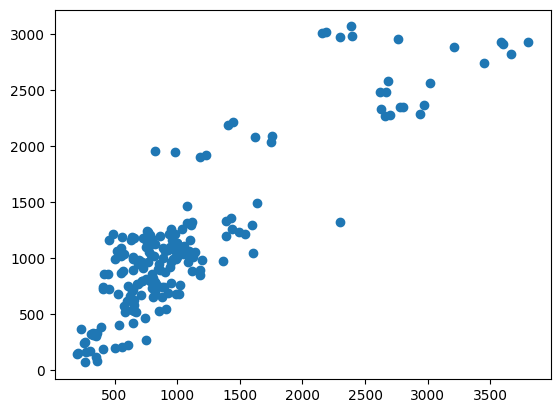

In [43]:
plt.scatter(y_test,y_pred_LR)

In [44]:
#Evaluation metrics
from sklearn import metrics

In [45]:
metrics.mean_absolute_error(y_test,y_pred_LR)

272.99497275663356

In [46]:
metrics.mean_squared_error(y_test,y_pred_LR)

127087.65465498985

In [47]:
np.sqrt(metrics.mean_absolute_error(y_test,y_pred_LR))

16.522559509852993

Optimiziting the linear regression model

In [48]:
model7 = LinearRegression()

In [49]:
from sklearn.model_selection import GridSearchCV, train_test_split
# Define the hyperparameter grid
param_grid7 = {'fit_intercept': [True, False]}

# Create the grid search object
grid_search7 = GridSearchCV(model7, param_grid7, cv=5)

# Fit the grid search to the training data
grid_search7.fit(X_train, y_train)

# Get the best hyperparameters
best_params7 = grid_search7.best_params_

# Create a new instance of LinearRegression with the best hyperparameters
model8 = LinearRegression(fit_intercept=best_params7['fit_intercept'])

# Fit the model to the training data
model8.fit(X_train, y_train)

# Make predictions on the test set
y_pred_7 = model8.predict(X_test)

In [50]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
mse = mean_squared_error(y_test, y_pred_7)

rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test,y_pred_7)
r2 = r2_score(y_test, y_pred_7)

print(f"Mean squared error: {mse}")
print(f"Root mean squared error: {rmse}")
print(f"Mean absolute error: {mae}")
print(f"R-squared score: {r2}")

Mean squared error: 127087.65465498985
Root mean squared error: 356.4935548575736
Mean absolute error: 272.99497275663356
R-squared score: 0.7764851695422039


In [51]:
# dataset containing whole price for only pulses and nuts
pulses_nuts_wholesale_df= wholesale_df[wholesale_df['category']== 'pulses and nuts'].reset_index(drop=True)
# dropping category column
pulses_nuts_wholesale_df=pulses_nuts_wholesale_df.drop(columns='category')

# converting columns(latitude, longitude and price)from data type object to float
pulses_nuts_wholesale_df[['latitude', 'longitude', 'price']] = pulses_nuts_wholesale_df[['latitude', 'longitude', 'price']].astype(float)
# converting date column from data type object to date_time
pulses_nuts_wholesale_df['date'] = pd.to_datetime(pulses_nuts_wholesale_df['date'])

# Convert datetime column to Unix timestamps
pulses_nuts_wholesale_df['date'] = pulses_nuts_wholesale_df['date'].apply(lambda x: pd.Timestamp(x).timestamp())

# Convert timestamps to dtype float
pulses_nuts_wholesale_df['date'] = pulses_nuts_wholesale_df['date'].astype(float)
#converting commodity from object datatype to dummies which are suitable for machine learning algorithms
dummies = pd.get_dummies(pulses_nuts_wholesale_df.commodity)

#Putting each commodity in its column
pulses_nuts_wholesale_df_dummies = pd.concat([pulses_nuts_wholesale_df, dummies], axis='columns')
pulses_nuts_wholesale_df_dummies.head()
#dropping columns(cassava flour and commodity):
#because of multi-collinearnity and datatype being object respectively
df_clean1 = pulses_nuts_wholesale_df_dummies.drop(['commodity'], axis=1)
df_clean1
#Creating features and label datasets
X1=df_clean1[['date','latitude','longitude','Beans']]
y1 = df_clean1['price']

In [52]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283839 sha256=575565a01c200a15919bdea25ecbf05706eb8db678c9477f71fbb3fd947f25e5
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [53]:
import lime
import lime.lime_tabular

Create the explainer

In [54]:
# LIME has one explainer for all the models
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns.values.tolist(),
                                                  class_names=['price'], verbose=True, mode='regression')

In [55]:
j = 5
exp = explainer.explain_instance(X_test.values[j], OLS.predict, num_features=5)

Intercept 2401.5405369603077
Prediction_local [851.94539333]
Right: 885.6216599227491


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



In [56]:
# Show the predictions
exp.show_in_notebook(show_table=True)

In [57]:
exp.as_list()

[('Rice <= 0.00', -1336.768794923),
 ('0.00 < Maize <= 1.00', -464.1945373753426),
 ('1409400000.00 < date <= 1521072000.00', 184.98939044897892),
 ('32.57 < longitude <= 32.91', 68.0669884303662),
 ('0.32 < latitude <= 2.23', -1.6881902090445133)]

In [58]:
# Choose the 10th instance and use it to predict the results
j = 10
exp = explainer.explain_instance(X_test.values[j], OLS.predict, num_features=5)

Intercept 2724.272573299803
Prediction_local [154.01348533]
Right: 385.61146600450866


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



In [59]:
# Show the predictions
exp.show_in_notebook(show_table=True)

In [60]:
exp.as_list()

[('Rice <= 0.00', -1359.137097058286),
 ('date <= 1300147200.00', -593.702809352943),
 ('0.00 < Maize <= 1.00', -469.9106680019325),
 ('longitude <= 32.57', -156.52139301124998),
 ('latitude <= 0.32', 9.012879451474776)]

In [61]:
# Choose the 15th instance and use it to predict the results
j = 150
exp = explainer.explain_instance(X_test.values[j], OLS.predict, num_features=5)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



Intercept 2324.6782509684863
Prediction_local [1138.82234608]
Right: 993.7810643887287


In [62]:
# Show the predictions
exp.show_in_notebook(show_table=True)

In [63]:
exp.as_list()

[('Rice <= 0.00', -1355.4950564010635),
 ('date > 1521072000.00', 578.7867004283073),
 ('0.00 < Maize <= 1.00', -469.9289059408071),
 ('32.57 < longitude <= 32.91', 64.69763432055258),
 ('0.32 < latitude <= 2.23', -3.916277291077857)]



```
# This is formatted as code
```

** **bold text***ELI5***

In [64]:
!pip install shap


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 10.9 MB/s eta 0:00:00


In [65]:
import shap


Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [66]:
# Assuming X_test is your test data
explainer = shap.Explainer(OLS, X_train)
shap_values = explainer(X_test)

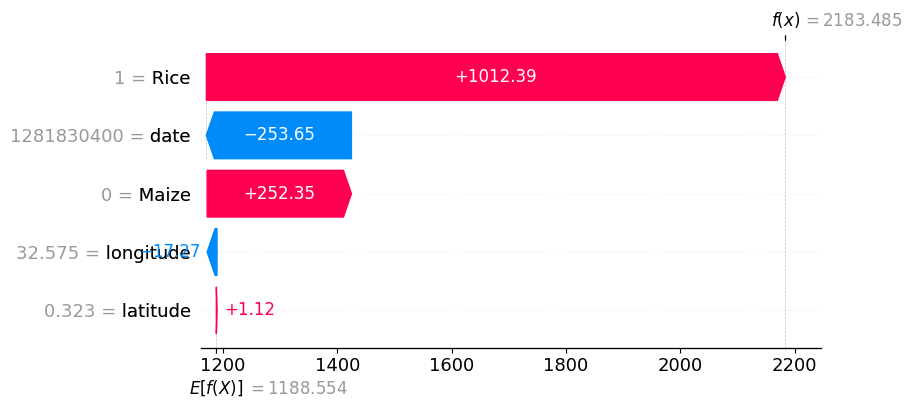

In [67]:
# Visualize the SHAP values
shap.plots.waterfall(shap_values[0])

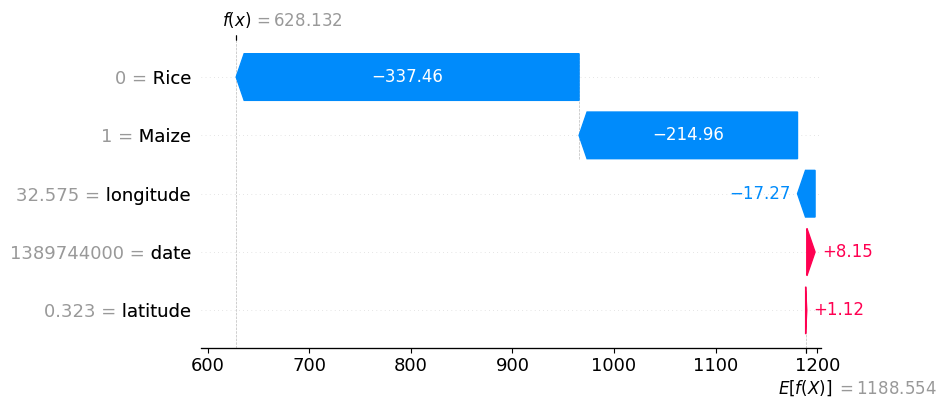

In [68]:
# Visualize the SHAP values
shap.plots.waterfall(shap_values[1])

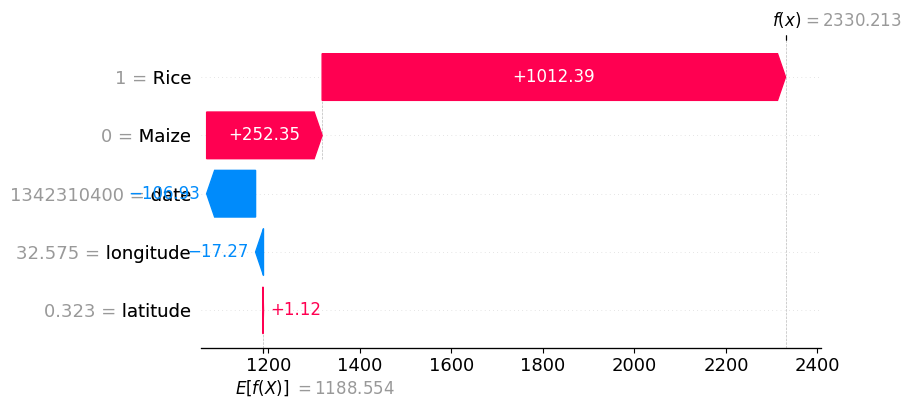

In [69]:
# Visualize the SHAP values
shap.plots.waterfall(shap_values[16])

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


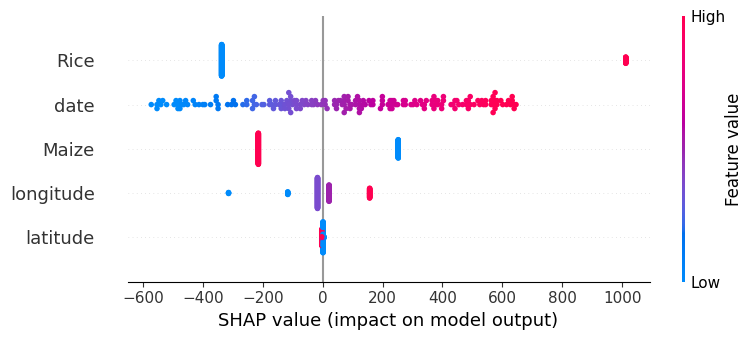

In [70]:
#sumarry plot
shap.summary_plot(shap_values, X_test)


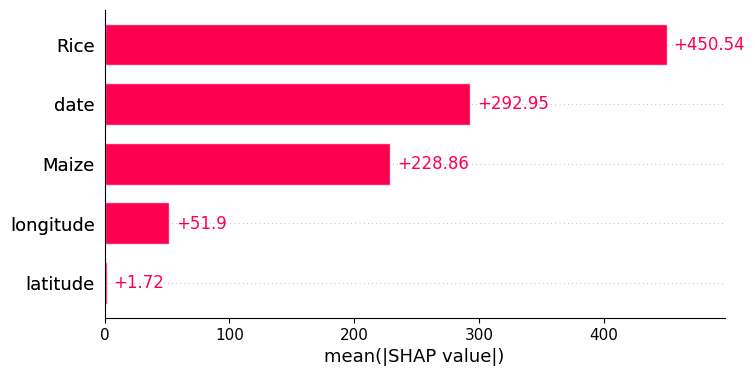

In [71]:
shap.plots.bar(shap_values)



```
`# This is formatted as code`
```

KNNRegression

In [72]:
from sklearn.neighbors import KNeighborsRegressor

In [73]:
Knn = KNeighborsRegressor(n_neighbors=1)

In [74]:
Knn.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=1)

In [75]:
Pred =Knn.predict(X_test)

In [76]:
Pred

array([ 430.77,  925.  ,  782.15, 3679.75, 1540.  , 2390.  , 1150.65,
       1370.  ,  821.15,  723.64, 1310.97, 1092.63,  222.75,  882.6 ,
       2167.36, 1055.7 ,  943.47,  605.34,  596.67, 1000.  , 1200.  ,
       2418.01,  937.5 ,  465.62,  395.99,  656.64,  804.12, 2860.49,
       3171.4 , 1134.14, 1033.33, 1235.24,  825.  ,  890.  ,  851.94,
        800.91,  741.38,  715.92,  813.22, 1080.89,  303.11, 1183.25,
       1235.24,  654.63, 1407.28,  742.32,  444.93,  903.33,  980.43,
        647.74,  810.  ,  514.29,  591.35,  683.57,  947.42,  465.62,
       3572.5 ,  465.62, 3343.03,  900.  ,  563.29,  563.29,  665.4 ,
        639.39,  430.77,  214.87,  757.24,  660.02,  699.55,  943.47,
        950.  ,  890.  , 1550.1 , 3282.12, 2400.  , 2860.49, 3503.96,
        829.48, 1450.  ,  587.67, 1180.71,  920.  , 1600.  ,  624.33,
        836.4 ,  658.57,  785.35, 2898.4 ,  383.26,  798.76, 1107.92,
       1190.  ,  498.39, 1270.  , 1183.25,  710.44,  254.69,  772.73,
        337.11, 1248

Evaluation of knnregressor model

In [77]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
# Compute the performance metrics of the KNN regression model
mse = mean_squared_error(y_test, Pred)

rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, Pred)
r2 = r2_score(y_test, Pred)

print(f"Mean squared error: {mse}")
print(f"Root mean squared error: {rmse}")
print(f"Mean absolute error: {mae}")
print(f"R-squared score: {r2}")

Mean squared error: 1254407.101851309
Root mean squared error: 1120.003170464847
Mean absolute error: 754.044712041885
R-squared score: -1.2061827441580077


TUNNING

In [78]:
knn1 = KNeighborsRegressor()
param_grid9 = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]
}
grid_search9 = GridSearchCV(knn1, param_grid9, cv=5)
grid_search9.fit(X_train, y_train)


GridSearchCV(cv=5, estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': [3, 5, 7], 'p': [1, 2],
                         'weights': ['uniform', 'distance']})

In [79]:
best_params9 = grid_search9.best_params_
best_score9 = grid_search9.best_score_

print("Best Hyperparameters:", best_params9)
print("Best Score:", best_score9)


Best Hyperparameters: {'n_neighbors': 7, 'p': 1, 'weights': 'uniform'}
Best Score: 0.08809168492681083


In [80]:
y_pred9 = grid_search9.predict(X_test)
mse = mean_squared_error(y_test, y_pred9)

rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred9)
r2 = r2_score(y_test, y_pred9)

print(f"Mean squared error: {mse}")
print(f"Root mean squared error: {rmse}")
print(f"Mean absolute error: {mae}")
print(f"R-squared score: {r2}")

Mean squared error: 590441.2119164227
Root mean squared error: 768.4017256073952
Mean absolute error: 582.3234255796559
R-squared score: -0.03843577674846377



random forest regressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()

In [ ]:
rf.fit(X_train, y_train)


In [ ]:
y_pred_rf = rf.predict(X_test)
y_pred_rf

In [ ]:
from sklearn.metrics import mean_squared_error
# Compute the performance metrics of the KNN regression model
mse = mean_squared_error(y_test, y_pred_rf)

rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred_rf)
r2 = r2_score(y_test, y_pred_rf)

print(f"Mean squared error: {mse}")
print(f"Root mean squared error: {rmse}")
print(f"Mean absolute error: {mae}")
print(f"R-squared score: {r2}")


In [ ]:
# tunig hyperparameters of the Random Forest Regressor using techniques such as grid search or randomized search.
from sklearn.model_selection import GridSearchCV

# Define a range of values for hyperparameters to search over
param_grid = {
    'n_estimators': [10, 50, 100],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a grid search object
grid = GridSearchCV(rf, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the grid search object to the training data
grid.fit(X_train, y_train)

# Print out the best hyperparameters and corresponding mean cross-validation score
print(f"Best hyperparameters: {grid.best_params_}")
print(f"Best cross-validation score: {-grid.best_score_}")


In [ ]:
#best hyerarameters
# create a new instance of the RandomForestRegressor class with the best hyperparameters
rf1 = RandomForestRegressor(n_estimators=50, max_depth=None, min_samples_split=2)

# fit the model to your training data
rf1.fit(X_train, y_train)

In [ ]:
y_pred_rf1 = rf1.predict(X_test)


In [ ]:
# Compute the performance metrics of the RandomForestRegressor model
mse = mean_squared_error(y_test, y_pred_rf1)

rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test,y_pred_rf1)
r2 = r2_score(y_test, y_pred_rf1)

print(f"Mean squared error: {mse}")
print(f"Root mean squared error: {rmse}")
print(f"Mean absolute error: {mae}")
print(f"R-squared score: {r2}")

Support vector regression

In [ ]:
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

In [ ]:
# Before Fine-tuning
svm_before = SVR()
svm_before.fit(X_train, y_train)
y_pred_before = svm_before.predict(X_test)


In [ ]:
# Compute the performance metrics of the SVR model
mse = mean_squared_error(y_test, y_pred_before)

rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test,y_pred_before)
r2 = r2_score(y_test, y_pred_before)

print(f"Mean squared error: {mse}")
print(f"Root mean squared error: {rmse}")
print(f"Mean absolute error: {mae}")
print(f"R-squared score: {r2}")

In [ ]:
# Scale the features using standardization
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
# Define the parameter grid for the grid search
param_grid = {
    'C': [0.1, 1, 10],
    'epsilon': [0.1, 0.01, 0.001],
    'kernel': ['linear', 'rbf']
}

In [ ]:
# Create the SVR model
svr = SVR()


In [ ]:
# Perform grid search with cross-validation
grid_search = GridSearchCV(svr, param_grid, cv=5)
grid_search.fit(X_train_scaled, y_train)

In [ ]:
# Get the best SVR model
best_svr = grid_search.best_estimator_

In [ ]:
# Make predictions on the test set
y_pred_SVR = best_svr.predict(X_test_scaled)
y_pred_SVR

In [ ]:
# Compute the performance metrics of the SVR model
mse = mean_squared_error(y_test, y_pred_SVR)

rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test,y_pred_SVR)
r2 = r2_score(y_test, y_pred_SVR)

print(f"Mean squared error: {mse}")
print(f"Root mean squared error: {rmse}")
print(f"Mean absolute error: {mae}")
print(f"R-squared score: {r2}")

XGBOOST

In [ ]:
import xgboost as xgb
from sklearn.model_selection import train_test_split


In [ ]:
# Create the XGBoost regressor
xgb_regressor = xgb.XGBRegressor()

In [ ]:
# Train the regressor on the training set
xgb_regressor.fit(X_train, y_train)


In [ ]:
# Make predictions on the testing set
y_pred_xgb = xgb_regressor.predict(X_test)

In [ ]:
# Compute the performance metrics of the XGBOOST model
mse = mean_squared_error(y_test, y_pred_xgb)

rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test,y_pred_xgb)
r2 = r2_score(y_test, y_pred_xgb)

print(f"Mean squared error: {mse}")
print(f"Root mean squared error: {rmse}")
print(f"Mean absolute error: {mae}")
print(f"R-squared score: {r2}")

ELI5

In [ ]:
pip install eli5

In [ ]:
from eli5 import explain_weights, explain_prediction_xgboost
import eli5


In [ ]:
explain_weights(xgb_regressor)

In [ ]:
# Get a single sample from the test set
samp = X_test.iloc[0]
# Use eli5's explain_prediction to explain the prediction for the sample
explanation = eli5.explain_prediction_xgboost(xgb_regressor, samp)



In [ ]:
featuress=df_clean.columns[:-1]
df_clean.head()

In [ ]:
# Print the explanation
print(explanation)

after model optimization

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
import xgboost as xgb
# Create the XGBoost regressor
xgb_regressor1 = xgb.XGBRegressor()

In [ ]:
param_grid = {
    'max_depth': [3, 4, 5],
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [100, 500, 1000],
    'subsample': [0.8, 0.9, 1],
    'colsample_bytree': [0.8, 0.9, 1],
}
best_rmse = float("inf")
best_params = None

for max_depth in param_grid['max_depth']:
    for learning_rate in param_grid['learning_rate']:
        for n_estimators in param_grid['n_estimators']:
            for subsample in param_grid['subsample']:
                for colsample_bytree in param_grid['colsample_bytree']:
                    params = {
                        'max_depth': max_depth,
                        'learning_rate': learning_rate,
                        'n_estimators': n_estimators,
                        'subsample': subsample,
                        'colsample_bytree': colsample_bytree,
                    }

                    # Initialize and train the XGBoost model
                    model = xgb.XGBRegressor(**params)
                    model.fit(X_train, y_train)

                    # Make predictions on the test set
                    y_pred3 = model.predict(X_test)

                    # Calculate RMSE
                    rmse = np.sqrt(mean_squared_error(y_test,y_pred3))

                    # Update best RMSE and best parameters if a better combination is found
                    if rmse < best_rmse:
                        best_rmse = rmse
                        best_params = params


In [ ]:
best_model3 = xgb.XGBRegressor(**best_params)
best_model3.fit(X_train, y_train)


In [ ]:
y_pred3 = best_model3.predict(X_test)
mse = mean_squared_error(y_test, y_pred3)

rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test,y_pred3)
r2 = r2_score(y_test, y_pred3)

print(f"Mean squared error: {mse}")
print(f"Root mean squared error: {rmse}")
print(f"Mean absolute error: {mae}")
print(f"R-squared score: {r2}")

LightGBM

In [ ]:
import lightgbm as lgb
# Create the LightGBM regressor
lgb_regressor = lgb.LGBMRegressor()

In [ ]:
# Train the regressor on the training set
lgb_regressor.fit(X_train, y_train)

In [ ]:
# Make predictions on the testing set
y_pred_lgbm = lgb_regressor.predict(X_test)

In [ ]:
# Compute the performance metrics of the LGBM model
mse = mean_squared_error(y_test, y_pred_lgbm)

rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test,y_pred_lgbm)
r2 = r2_score(y_test, y_pred_lgbm)

print(f"Mean squared error: {mse}")
print(f"Root mean squared error: {rmse}")
print(f"Mean absolute error: {mae}")
print(f"R-squared score: {r2}")

In [ ]:
# LightGBM after fine-tuning
model_after1 = lgb.LGBMRegressor()

# Define the parameter grid for tuning
param_grid11 = {
    'num_leaves': [20, 30, 40],
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [100, 200, 300]
}

In [ ]:
# Perform grid search cross-validation
grid_search11 = GridSearchCV(estimator=model_after1, param_grid=param_grid11, cv=5)
grid_search11.fit(X_train, y_train)

# Get the best parameters and model
best_params11 = grid_search11.best_params_
best_model11 = grid_search11.best_estimator_

# Train the best model
best_model11.fit(X_train, y_train)

# Make predictions on the test set
y_pred_after1 = best_model11.predict(X_test)

In [ ]:
# Compute the performance metrics of the LGBM model
mse = mean_squared_error(y_test, y_pred_after1)

rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test,y_pred_after1)
r2 = r2_score(y_test, y_pred_after1)

print(f"Mean squared error: {mse}")
print(f"Root mean squared error: {rmse}")
print(f"Mean absolute error: {mae}")
print(f"R-squared score: {r2}")

CatBoost regressor

In [ ]:
!pip install catboost

In [ ]:
from catboost import CatBoostRegressor

In [ ]:
# Create the CatBoostRegressor instance
m = CatBoostRegressor()
# Train the model
m.fit(X_train, y_train)


In [ ]:
# Make predictions on the test set
y_pred_catboost = m.predict(X_test)


In [ ]:
# Compute the performance metrics of the CATBOOST model
mse = mean_squared_error(y_test, y_pred_catboost)

rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test,y_pred_catboost)
r2 = r2_score(y_test, y_pred_catboost)

print(f"Mean squared error: {mse}")
print(f"Root mean squared error: {rmse}")
print(f"Mean absolute error: {mae}")
print(f"R-squared score: {r2}")

hyperparameter tuning for CATBOOST

In [ ]:
from sklearn.model_selection import GridSearchCV
# Define the hyperparameters grid
model6 = CatBoostRegressor()

param_grid6 = {
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [4, 6, 8],
    'n_estimators': [100, 200, 300],
}
grid_search6 = GridSearchCV(estimator=model6, param_grid=param_grid6, cv=3, scoring='neg_mean_squared_error')
grid_search6.fit(X_train, y_train)
best_params6 = grid_search6.best_params_
best_model6 = grid_search6.best_estimator_
y_pred6 = best_model6.predict(X_test)

In [ ]:
mse = mean_squared_error(y_test, y_pred6)

rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test,y_pred6)
r2 = r2_score(y_test, y_pred6)

print(f"Mean squared error: {mse}")
print(f"Root mean squared error: {rmse}")
print(f"Mean absolute error: {mae}")
print(f"R-squared score: {r2}")